Code for **super-resolution** (figures $1$ and $5$ from main paper).. Change `factor` to $8$ to reproduce images from fig. $9$ from supmat.

You can play with parameters and see how they affect the result. 

In [1]:
"""
*Uncomment if running on colab* 
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab 
"""
# !git clone https://github.com/DmitryUlyanov/deep-image-prior
# !mv deep-image-prior/* ./

'\n*Uncomment if running on colab* \nSet Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab \n'

# Import libs

In [2]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import argparse
import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import numpy as np
from models import *

import torch
import torch.optim
from skimage.filters import unsharp_mask

# from skimage.measure import compare_psnr
from models.downsampler import Downsampler
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from skimage.metrics import structural_similarity

from utils.sr_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize = -1 
factor = 2 # 8
enforse_div32 = 'CROP' # we usually need the dimensions to be divisible by a power of two (32 in this case)
PLOT = True

# To produce images from the paper we took *_GT.png images from LapSRN viewer for corresponding factor,
# e.g. x4/zebra_GT.png for factor=4, and x8/zebra_GT.png for factor=8 
path_to_image = 'data/sr/zebra_GT.png'

In [7]:
def get_image(path, imsize=-1):
    """Load an image and resize to a cpecific size. 

    Args: 
        path: path to image
        imsize: tuple or scalar with dimensions; -1 for `no resize`
    """
    img = load(path)

    if isinstance(imsize, int):
        imsize = (imsize, imsize)

    if imsize[0]!= -1 and img.size != imsize:
        if imsize[0] > img.size[0]:
            img = img.resize(imsize, Image.BICUBIC)
        else:
            img = img.resize(imsize, Image.ANTIALIAS)

    img_np = pil_to_np(img)

    return img, img_np


In [10]:
img = load(path_to_image)
if isinstance(imsize, int):
    imsize = (imsize, imsize)


In [12]:
imsize[0]

-1

In [2]:
!pwd

/home/srinadb/CCNet/deep-image-prior-master


In [42]:
img_LR_np = np.load('/home/srinadb/Downloads/Dataset/LR/sample100.npy')
img_HR_np = np.load('/home/srinadb/Downloads/Dataset/HR/sample100.npy')

In [43]:
import cv2

# Remove the batch dimension
img = img_LR_np[0]
# img = img_LR_np

# Resize using bicubic interpolation
img_LR_bicubic = cv2.resize(img, (150, 150), interpolation=cv2.INTER_CUBIC)

# Resize using nearest neighbor interpolation
img_LR_nearest = cv2.resize(img, (150, 150), interpolation=cv2.INTER_NEAREST)

img_LR_bicubic_filtered = unsharp_mask(img_LR_bicubic)

img_LR_bicubic = np.reshape(img_LR_bicubic, (1, 150, 150))
img_LR_nearest = np.reshape(img_LR_nearest, (1, 150, 150))
img_LR_bicubic_filtered = np.reshape(img_LR_bicubic_filtered, (1, 150, 150))

print("Bicubic image shape:", img_LR_bicubic.shape)   # Expected: (1, 150, 150)
print("Nearest image shape:", img_LR_nearest.shape)     # Expected: (1, 150, 150)
print("Filtered Bicubic image shape:", img_LR_bicubic_filtered.shape)     # Expected: (1, 150, 150)


Bicubic image shape: (1, 150, 150)
Nearest image shape: (1, 150, 150)
Filtered Bicubic image shape: (1, 150, 150)


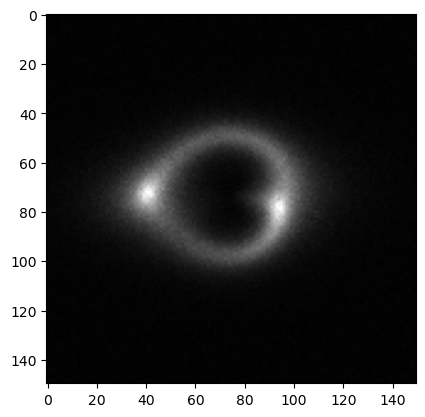

In [44]:
plt.imshow(img_HR_np[0,:,:], cmap='gray')

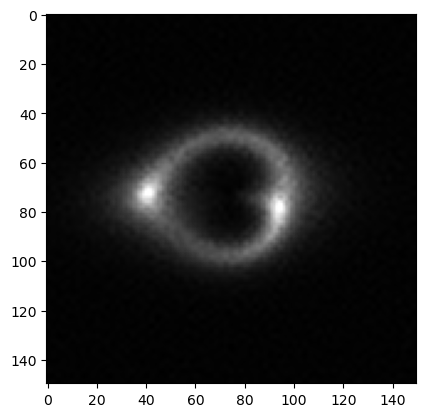

In [45]:
plt.imshow(img_LR_bicubic_filtered[0,:,:], cmap='gray')

In [7]:
from PIL import Image, ImageFilter
# Remove the batch dimension
# img = img_LR_np[0]

# Convert numpy array to PIL Image (using mode 'L' for grayscale)
img_pil = Image.fromarray(img, mode='L')

# Resize using bicubic interpolation
img_LR_bicubic = img_pil.resize((150, 150), resample=Image.BICUBIC)

# Apply UnsharpMask filter with chosen parameters (adjust radius, percent, and threshold as needed)
img_LR_bicubic_filtered = img_LR_bicubic.filter(ImageFilter.UnsharpMask())

# Resize using nearest neighbor interpolation
img_LR_nearest = img_pil.resize((150, 150), resample=Image.NEAREST)

# Convert filtered images back to numpy arrays and add the batch dimension if necessary
img_LR_bicubic = np.array(img_LR_bicubic)[np.newaxis, ...]
img_LR_nearest = np.array(img_LR_nearest)[np.newaxis, ...]
img_LR_bicubic_filtered = np.array(img_LR_bicubic_filtered)[np.newaxis, ...]

print("Bicubic filtered image shape:", img_LR_bicubic.shape)   # Expected: (1, 150, 150)
print("Nearest filtered image shape:", img_LR_nearest.shape)     # Expected: (1, 150, 150)


Bicubic filtered image shape: (1, 150, 150)
Nearest filtered image shape: (1, 150, 150)


In [7]:
from skimage import img_as_float
from skimage.filters import unsharp_mask
import matplotlib.pyplot as plt

# Convert the image to float
image_float = img_as_float(image)

# Apply unsharp mask
sharpened_image = unsharp_mask(image_float, radius=1.0, amount=1.0)

# Display the original and sharpened images
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image_float, cmap=plt.cm.gray)
ax[0].set_title('Original Image')

ax[1].imshow(sharpened_image, cmap=plt.cm.gray)
ax[1].set_title('Sharpened Image')

for a in ax:
    a.axis('off')

plt.tight_layout()
plt.show()


NameError: name 'image' is not defined

In [7]:
img_HR_np.shape

(1, 150, 150)

In [7]:
s=structural_similarity(img_HR_np[0,:,:], img_LR_bicubic_filtered[0,:,:], data_range=1.0, multichannel=False)
# ssim_index = ssim(img1, img2, data_range=1.0, multichannel=False)
# print("SSIM (grayscale):", ssim_index)
# s = structural_similarity(img_HR_np, img_LR_bicubic, data_range=1.0,
#                             multichannel=False, win_size=3)
print(s)

0.9702462805808486


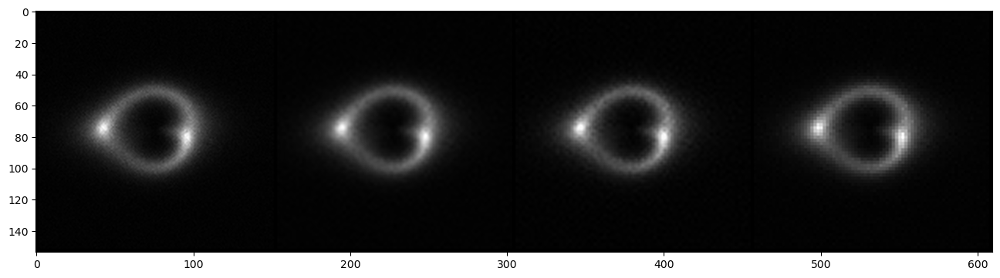

PSNR bicubic: 41.8184   PSNR nearest: 38.4811


In [46]:
if PLOT:
    plot_image_grid([img_HR_np, img_LR_bicubic, img_LR_bicubic_filtered, img_LR_nearest], 4,12);
    print ('PSNR bicubic: %.4f   PSNR nearest: %.4f' %  (
                                        compare_psnr(img_HR_np, img_LR_bicubic), 
                                        compare_psnr(img_HR_np, img_LR_nearest)))

In [37]:
input_depth = 32
 
INPUT =     'noise'
pad   =     'reflection'
OPT_OVER =  'net'
KERNEL_TYPE='lanczos2'

LR = 0.01
tv_weight = 0.0

OPTIMIZER = 'adam'

if factor == 2: 
    num_iter = 500
    reg_noise_std = 0.03
elif factor == 4:
    num_iter = 4000
    reg_noise_std = 0.05
else:
    assert False, 'We did not experiment with other factors'

In [38]:
net_input = get_noise(input_depth, INPUT, (img_HR_np.shape[1], img_HR_np.shape[2])).type(dtype).detach()

NET_TYPE = 'skip' # UNet, ResNet
net = get_net(input_depth, 'skip', pad,
              n_channels=1,
              skip_n33d=128, 
              skip_n33u=128, 
              skip_n11=4, 
              num_scales=5,
              upsample_mode='bilinear').type(dtype)

# Losses
mse = torch.nn.MSELoss().type(dtype)

img_LR_var = np_to_torch(img_LR_np).type(dtype)

downsampler = Downsampler(n_planes=1, factor=factor, kernel_type=KERNEL_TYPE, phase=0.5, preserve_size=True).type(dtype)


In [39]:
net_input.shape

torch.Size([1, 32, 150, 150])

In [40]:
def closure():
    global i, net_input
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out_HR = net(net_input)
    # print(out_HR.shape)
    # print(net_input.shape)
    out_LR = downsampler(out_HR)
    # print(out_LR)
    # print(out_HR)
    total_loss = mse(out_LR, img_LR_var) 
    
    if tv_weight > 0:
        total_loss += tv_weight * tv_loss(out_HR)
        
    total_loss.backward()

    # Log
    psnr_LR = compare_psnr(img_LR_np, torch_to_np(out_LR))
    psnr_HR = compare_psnr(img_HR_np, torch_to_np(out_HR))
    
#     img_LR_np = img_LR_np.astype(np.float32)
#     out_LR_np = torch_to_np(out_LR).astype(np.float32)

#     img_HR_np = img_HR_np.astype(np.float32)
#     out_HR_np = torch_to_np(out_HR).astype(np.float32)

    ssim_LR = structural_similarity(img_LR_np[0,:,:], torch_to_np(out_LR)[0,:,:], data_range=1.0, multichannel=False)
    ssim_HR = structural_similarity(img_HR_np[0,:,:], torch_to_np(out_HR)[0,:,:], data_range=1.0, multichannel=False)
    
    # print(f'Iteration {i:05d}    PSNR_LR {psnr_LR:.3f}   PSNR_HR {psnr_HR:.3f}', '\r', end='')

    print ('Iteration %05d    PSNR_LR %.3f   PSNR_HR %.3f SSIM_LR %.3f SSIM_HR %.3f' % (i, psnr_LR, psnr_HR, ssim_LR, ssim_HR), '\r', end='')
                      
    # History
    psnr_history.append([psnr_LR, psnr_HR, ssim_LR, ssim_HR])
    
    if PLOT and i % 100 == 0:
        out_HR_np = torch_to_np(out_HR)
        plot_image_grid([img_HR_np, img_LR_bicubic, np.clip(out_HR_np, 0, 1)], factor=13, nrow=3)
        
    # Save the model every 100 iterations
    if i==0 or (i+1) % 100 == 0:
        save_path = f'net_checkpoint_iteration_{i+1}.pth'
        torch.save(net.state_dict(), save_path)
        print(f'\nModel saved at iteration {i} to {save_path}')    

    i += 1
    
    return total_loss

In [26]:
def closure():
    global i, net_input
    
    # Add regularization noise if needed
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    # Forward pass: generate HR output and downsample to get LR output
    out_HR = net(net_input)
    out_LR = downsampler(out_HR)

    # Compute loss on the LR output against the LR target
    total_loss = mse(out_LR, img_LR_var) 
    if tv_weight > 0:
        total_loss += tv_weight * tv_loss(out_HR)
        
    total_loss.backward()

    # Convert torch outputs to numpy arrays
    out_HR_np = torch_to_np(out_HR)
    # print(out_HR_np.shape)
    out_LR_np = torch_to_np(out_LR)

    # Helper to ensure both images have the same number of channels
    def match_channels(img1, img2):
        # If one image is grayscale (1 channel) and the other RGB (3 channels),
        # replicate the grayscale image along the channel dimension.
        if img1.shape[0] == 1 and img2.shape[0] == 3:
            img1 = np.repeat(img1, 3, axis=0)
        elif img1.shape[0] == 3 and img2.shape[0] == 1:
            img2 = np.repeat(img2, 3, axis=0)
        return img1, img2

    # Match channels for LR and HR images before computing PSNR
    lr_target, lr_out = match_channels(img_LR_np, out_LR_np)
    hr_target, hr_out = match_channels(img_HR_np, out_HR_np)

    # Helper to prepare image for PSNR calculation.
    # If image has 3 channels, transpose it to (H, W, 3), else remove the channel dim.
    def prepare_for_psnr(img):
        if img.shape[0] == 3:
            return img.transpose(1, 2, 0)
        else:
            return img[0]

    # Compute PSNR values
    psnr_LR = compare_psnr(prepare_for_psnr(lr_target), prepare_for_psnr(lr_out))
    psnr_HR = compare_psnr(prepare_for_psnr(hr_target), prepare_for_psnr(hr_out))

    print('Iteration %05d    PSNR_LR %.3f   PSNR_HR %.3f' % (i, psnr_LR, psnr_HR), '\r', end='')
                      
    # Record PSNR history
    psnr_history.append([psnr_LR, psnr_HR])
    
    # Optionally plot images every 100 iterations
    if PLOT and i % 100 == 0:
        plot_image_grid([img_HR_np, img_LR_bicubic, np.clip(out_HR_np, 0, 1)], factor=13, nrow=3)

    i += 1
    
    return total_loss


In [14]:
def closure():
    global i, net_input

    # Add regularization noise if needed
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    # Forward pass: generate HR output and downsample to get LR output
    out_HR = net(net_input)
    out_LR = downsampler(out_HR)

    # Compute loss on the LR output against the LR target
    total_loss = mse(out_LR, img_LR_var)
    if tv_weight > 0:
        total_loss += tv_weight * tv_loss(out_HR)

    total_loss.backward()

    # Convert torch outputs to numpy arrays
    out_HR_np = torch_to_np(out_HR)
    out_LR_np = torch_to_np(out_LR)

    # Ensure the target and output images have the same dimensions
    def resize_to_match(img1, img2):
        if img1.shape != img2.shape:
            img2_resized = resize(img2, img1.shape, anti_aliasing=True)
            return img2_resized
        return img2

    # Resize output images to match target images
    out_LR_np = resize_to_match(img_LR_np, out_LR_np)
    out_HR_np = resize_to_match(img_HR_np, out_HR_np)

    # Compute PSNR values
    psnr_LR = compare_psnr(img_LR_np, out_LR_np)
    psnr_HR = compare_psnr(img_HR_np, out_HR_np)
    
    ssim_LR = structural_similarity(img_LR_np, out_LR_np, data_range=1.0, multichannel=False)
    ssim_HR = structural_similarity(img_HR_np, out_HR_np, data_range=1.0, multichannel=False)
    
    print(f'Iteration {i:05d}    PSNR_LR {psnr_LR:.3f}   PSNR_HR {psnr_HR:.3f} SSIM_LR {ssim_LR:.3f} SSIM_HR {ssim_HR:.3f}', '\r', end='')

    # Record PSNR history
    psnr_history.append([psnr_LR, psnr_HR])

    # Optionally plot images every 100 iterations
    if PLOT and i % 100 == 0:
        plot_image_grid([img_HR_np, img_LR_bicubic, np.clip(out_HR_np, 0, 1)], factor=13, nrow=3)

    i += 1

    return total_loss


In [41]:
psnr_history = [] 
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

i = 0
p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

Starting optimization with ADAM


/local_scratch/slurm.2485895/ipykernel_3676896/261714076.py:21: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_LR = compare_psnr(img_LR_np, torch_to_np(out_LR))


ValueError: image_true has intensity values outside the range expected for its data type. Please manually specify the data_range.

In [14]:
net

Sequential(
  (1): Concat(
    (0): Sequential(
      (1): Sequential(
        (0): ReflectionPad2d((0, 0, 0, 0))
        (1): Conv2d(32, 4, kernel_size=(1, 1), stride=(1, 1))
      )
      (2): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (1): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(32, 128, kernel_size=(3, 3), stride=(2, 2))
      )
      (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): LeakyReLU(negative_slope=0.2, inplace=True)
      (4): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
      )
      (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): LeakyReLU(negative_slope=0.2, inplace=True)
      (7): Sequential(
        (1): Concat(
          (0): Sequential(
  

In [15]:
# import matplotlib.pyplot as plt
# import torch
# import torch.nn as nn

# def visualize_conv_filters(model, layer_name_contains=None):
#     """
#     Visualizes filters of all Conv2d layers in a model.
#     If layer_name_contains is provided, only layers whose name includes that substring are plotted.
#     """
#     for name, module in model.named_modules():
#         if isinstance(module, nn.Conv2d):
#             # Optionally, filter layers by name substring
#             if layer_name_contains is not None and layer_name_contains not in name:
#                 continue
#             # Get the weights: shape = (out_channels, in_channels, kH, kW)
#             weights = module.weight.data.cpu()
#             out_channels, in_channels, kH, kW = weights.shape

#             # For visualization, we can average over input channels
#             # This gives one filter per output channel
#             filters = weights.mean(dim=1)  # shape: (out_channels, kH, kW)
            
#             n_cols = min(out_channels, 8)
#             n_rows = (out_channels + n_cols - 1) // n_cols
#             fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*2, n_rows*2))
#             axes = axes.flatten() if out_channels > 1 else [axes]
            
#             for i in range(out_channels):
#                 filt = filters[i]
#                 # Normalize to [0,1] for visualization
#                 filt = (filt - filt.min()) / (filt.max() - filt.min() + 1e-8)
#                 axes[i].imshow(filt, cmap='gray')
#                 axes[i].set_title(f"Filter {i}")
#                 axes[i].axis('off')
#             # Hide any extra subplots
#             for j in range(i+1, len(axes)):
#                 axes[j].axis('off')
#             plt.suptitle(f"Filters in layer: {name}")
#             plt.tight_layout()
#             plt.show()

# # Example usage:
# visualize_conv_filters(net)


Found Conv2d layer: 3.1 with weight shape torch.Size([128, 132, 3, 3])


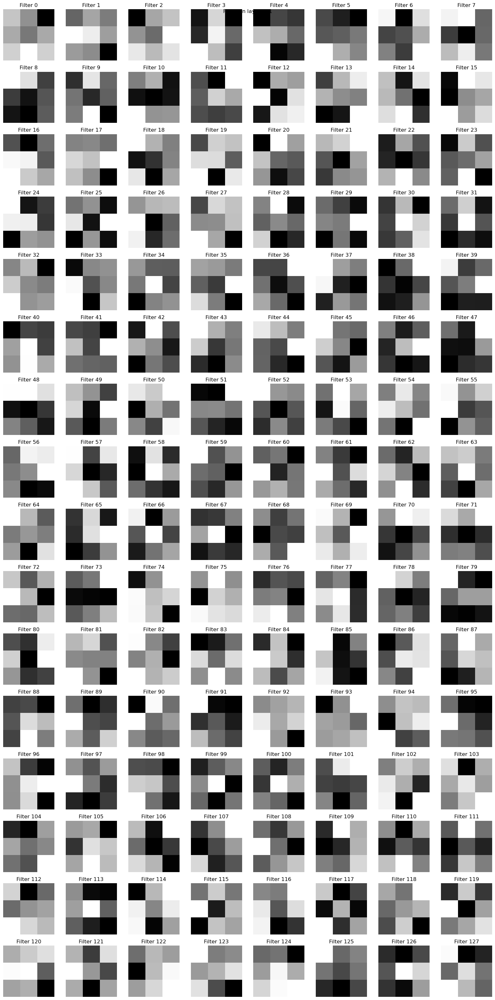

In [16]:
import re
import matplotlib.pyplot as plt
import torch.nn as nn
import numpy as np

def visualize_conv_filters_by_exact_name(model, target_name="3.1"):
    # Compile a regex that matches exactly the target_name
    pattern = re.compile(rf"^{re.escape(target_name)}$")
    found_layer = False
    for name, module in model.named_modules():
        if isinstance(module, nn.Conv2d):
            # Use fullmatch to check for an exact match
            if pattern.fullmatch(name):
                found_layer = True
                print(f"Found Conv2d layer: {name} with weight shape {module.weight.shape}")
                # Extract weights: shape = (out_channels, in_channels, kH, kW)
                weights = module.weight.data.cpu()
                out_channels, in_channels, kH, kW = weights.shape
                # Average over input channels for visualization
                filters = weights.mean(dim=1)  # shape: (out_channels, kH, kW)
                
                n_cols = min(out_channels, 8)
                n_rows = (out_channels + n_cols - 1) // n_cols
                fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*2, n_rows*2))
                if n_rows == 1 and n_cols == 1:
                    axes = [axes]
                else:
                    axes = axes.flatten()
                
                for i in range(out_channels):
                    filt = filters[i].numpy()
                    # Normalize filter values to [0, 1] for visualization
                    filt_min, filt_max = filt.min(), filt.max()
                    if filt_max - filt_min < 1e-8:
                        filt_norm = np.zeros_like(filt)
                    else:
                        filt_norm = (filt - filt_min) / (filt_max - filt_min)
                    axes[i].imshow(filt_norm, cmap='gray')
                    axes[i].set_title(f"Filter {i}")
                    axes[i].axis('off')
                # Hide any extra subplots
                for j in range(out_channels, len(axes)):
                    axes[j].axis('off')
                
                plt.suptitle(f"Filters in layer: {name}")
                plt.tight_layout()
                plt.show()
    if not found_layer:
        print(f"No Conv2d layers found with name exactly '{target_name}'.")

# Example usage:
visualize_conv_filters_by_exact_name(net, target_name="3.1")


Found Conv2d layer: 3.1 with weight shape torch.Size([128, 132, 3, 3])


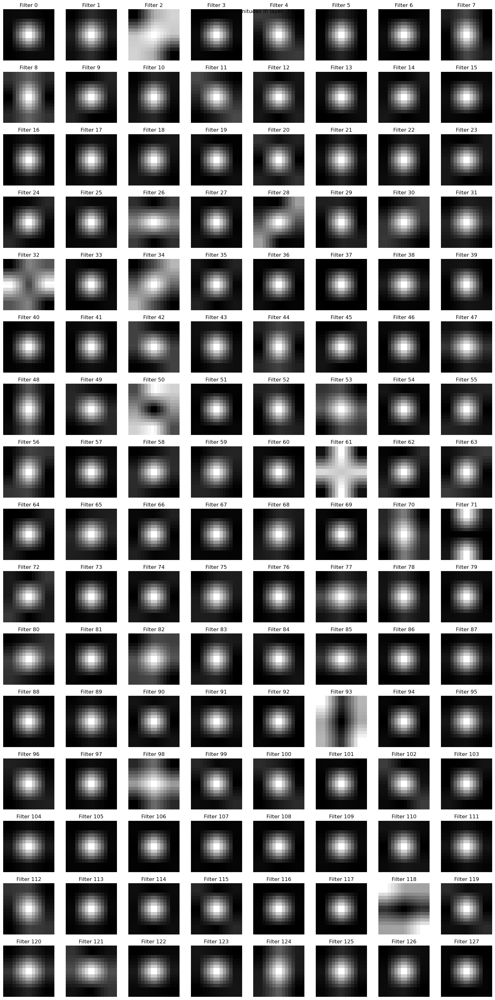

In [17]:
import re
import matplotlib.pyplot as plt
import torch.nn as nn
import numpy as np
import torch
import torch.fft

def visualize_conv_filters_dft(model, target_name="3.1"):
    # Compile a regex that matches exactly the target_name
    pattern = re.compile(rf"^{re.escape(target_name)}$")
    found_layer = False
    for name, module in model.named_modules():
        if isinstance(module, nn.Conv2d) and pattern.fullmatch(name):
            found_layer = True
            print(f"Found Conv2d layer: {name} with weight shape {module.weight.shape}")
            # Extract weights: shape = (out_channels, in_channels, kH, kW)
            weights = module.weight.data.cpu()
            out_channels, in_channels, kH, kW = weights.shape
            # Average over input channels for visualization
            filters = weights.mean(dim=1)  # shape: (out_channels, kH, kW)
            
            n_cols = min(out_channels, 8)
            n_rows = (out_channels + n_cols - 1) // n_cols
            fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*2, n_rows*2))
            if n_rows == 1 and n_cols == 1:
                axes = [axes]
            else:
                axes = axes.flatten()
            
            for i in range(out_channels):
                filt = filters[i].numpy()
                # Compute the 2D DFT of the filter
                filt_dft = np.fft.fftshift(np.fft.fft2(filt))
                # Compute the magnitude
                filt_dft_mag = np.abs(filt_dft)
                # Resize to 16x16 using interpolation
                filt_dft_mag_resized = np.array(Image.fromarray(filt_dft_mag).resize((16, 16), resample=Image.BILINEAR))
                # Normalize the DFT magnitude for visualization
                filt_dft_mag_resized /= filt_dft_mag_resized.max()
                axes[i].imshow(filt_dft_mag_resized, cmap='gray')
                axes[i].set_title(f"Filter {i}")
                axes[i].axis('off')
            # Hide any extra subplots
            for j in range(out_channels, len(axes)):
                axes[j].axis('off')
            
            plt.suptitle(f"16x16 DFT Magnitudes in layer: {name}")
            plt.tight_layout()
            plt.show()
    if not found_layer:
        print(f"No Conv2d layers found with name exactly '{target_name}'.")

# Example usage:
visualize_conv_filters_dft(net, target_name="3.1")


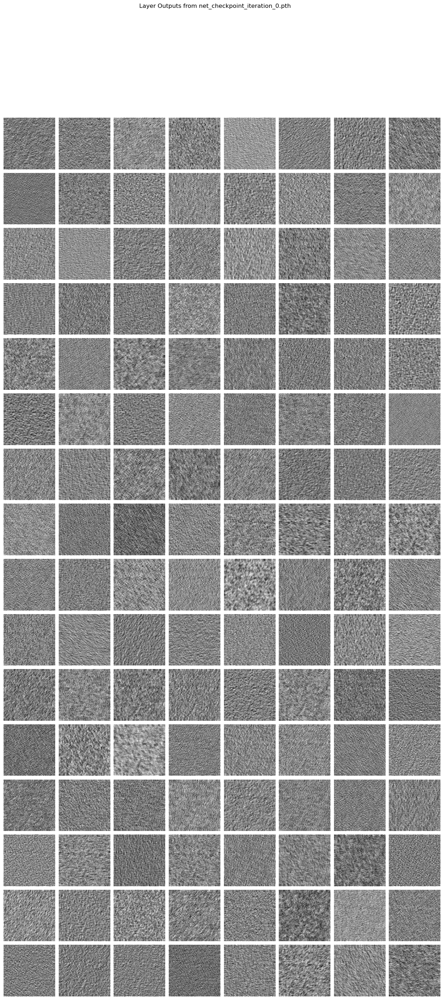

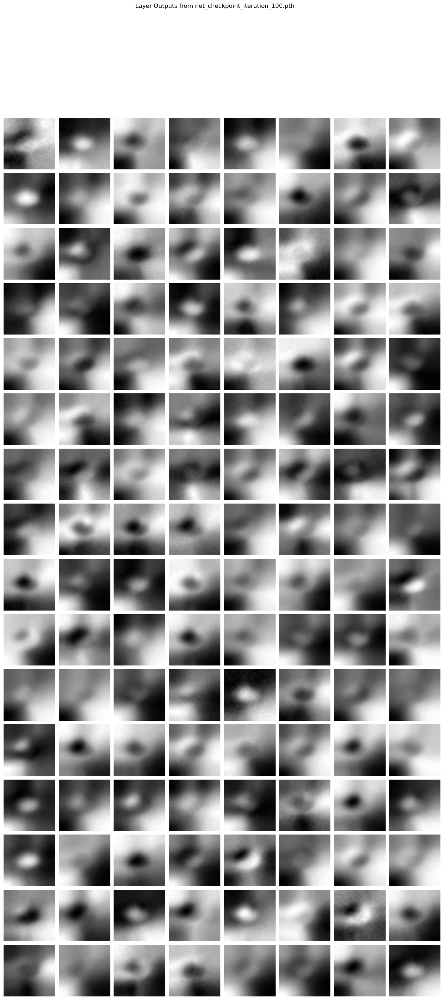

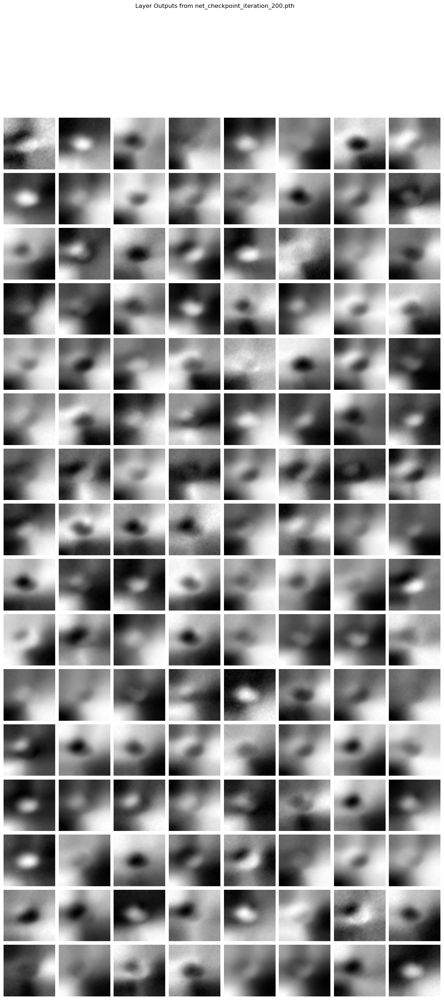

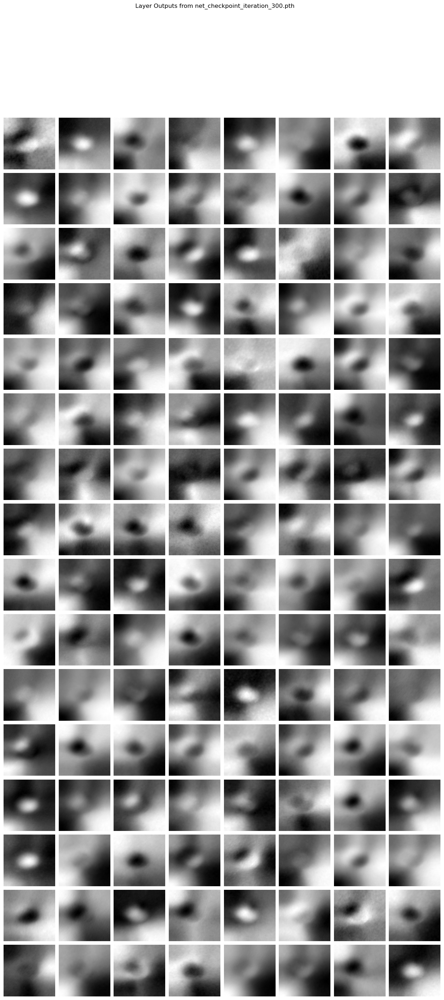

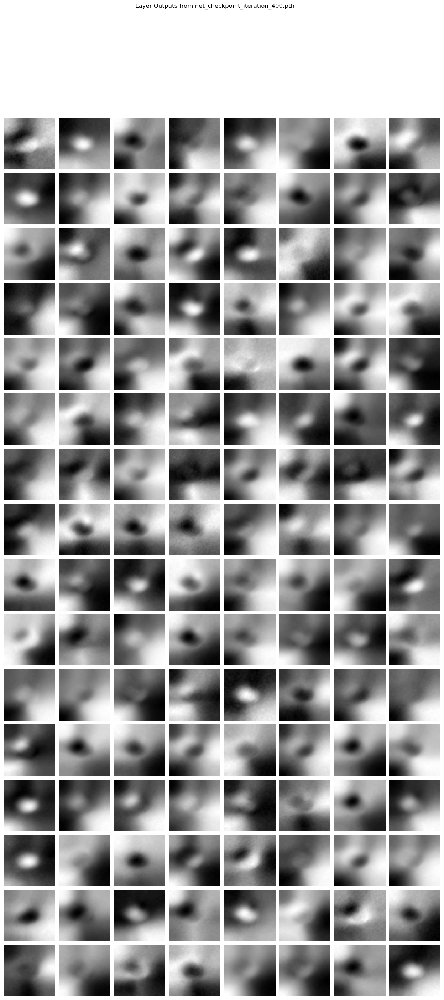

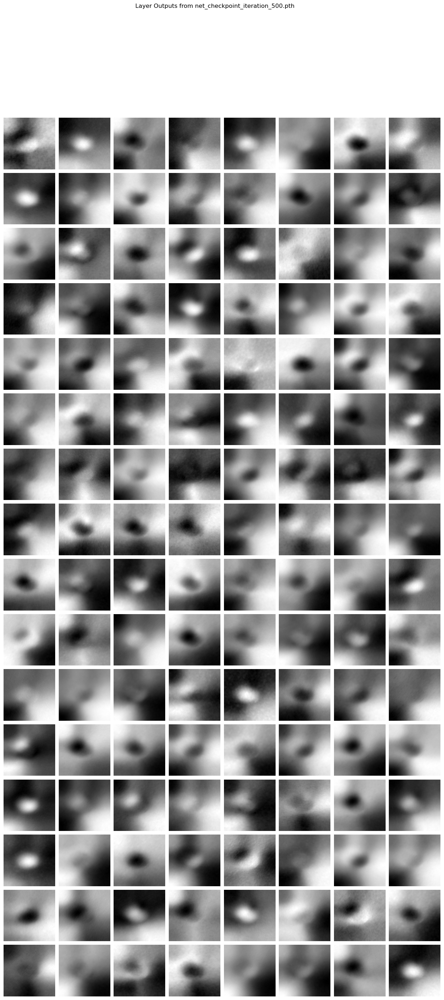

In [22]:
import torch
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

# Function to load the model checkpoint
def load_model_checkpoint(checkpoint_path):
    model = get_net(input_depth, 'skip', pad,
                    n_channels=1,
                    skip_n33d=128, 
                    skip_n33u=128, 
                    skip_n11=4, 
                    num_scales=5,
                    upsample_mode='bilinear').type(dtype)
    model.load_state_dict(torch.load(checkpoint_path))
    model.eval()
    return model

# Function to register a forward hook and capture the layer output
def get_layer_output(model, input_tensor, layer_name):
    layer_output = None

    def hook_fn(module, input, output):
        nonlocal layer_output
        layer_output = output.detach().cpu()

    # Register the hook
    for name, module in model.named_modules():
        if name == layer_name:
            hook_handle = module.register_forward_hook(hook_fn)
            break
    else:
        raise ValueError(f"No layer found with the exact name '{layer_name}'")

    # Perform a forward pass
    with torch.no_grad():
        model(input_tensor)

    # Remove the hook
    hook_handle.remove()

    return layer_output

# Function to plot the layer outputs
def plot_layer_outputs(layer_output, checkpoint_name):
    num_kernels = layer_output.shape[1]
    n_cols = min(num_kernels, 8)
    n_rows = (num_kernels + n_cols - 1) // n_cols

    fig = plt.figure(figsize=(n_cols * 2, n_rows * 2))
    grid = ImageGrid(fig, 111, nrows_ncols=(n_rows, n_cols), axes_pad=0.1)

    for i in range(num_kernels):
        ax = grid[i]
        ax.imshow(layer_output[0, i, :, :], cmap='gray')
        ax.axis('off')

    plt.suptitle(f"Layer Outputs from {checkpoint_name}")
    plt.show()

# Main function to process all checkpoints
def visualize_layer_across_checkpoints(checkpoint_paths, input_tensor, layer_name):
    for checkpoint_path in checkpoint_paths:
        # Load model
        model = load_model_checkpoint(checkpoint_path)
        # Get layer output
        layer_output = get_layer_output(model, input_tensor, layer_name)
        # Plot layer outputs
        plot_layer_outputs(layer_output, checkpoint_path)

# Example usage
checkpoint_paths = [
    'net_checkpoint_iteration_0.pth',
    'net_checkpoint_iteration_100.pth',
    'net_checkpoint_iteration_200.pth',
    'net_checkpoint_iteration_300.pth',
    'net_checkpoint_iteration_400.pth',
    'net_checkpoint_iteration_500.pth'
]
input_tensor = net_input  # Ensure this is properly defined
layer_name = "1.1.7.3.1"

visualize_layer_across_checkpoints(checkpoint_paths, input_tensor, layer_name)


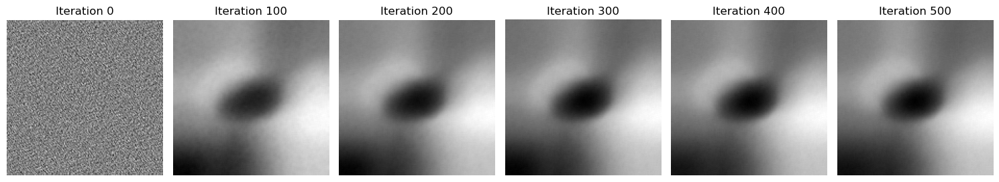

In [25]:
import torch
import matplotlib.pyplot as plt

# Function to load the model checkpoint
def load_model_checkpoint(checkpoint_path):
    model = get_net(input_depth, 'skip', pad,
                    n_channels=1,
                    skip_n33d=128, 
                    skip_n33u=128, 
                    skip_n11=4, 
                    num_scales=5,
                    upsample_mode='bilinear').type(dtype)
    model.load_state_dict(torch.load(checkpoint_path))
    model.eval()
    return model

# Function to register a forward hook and capture the layer output
def get_layer_output(model, input_tensor, layer_name):
    layer_output = None

    def hook_fn(module, input, output):
        nonlocal layer_output
        layer_output = output.detach().cpu()

    # Register the hook
    for name, module in model.named_modules():
        if name == layer_name:
            hook_handle = module.register_forward_hook(hook_fn)
            break
    else:
        raise ValueError(f"Layer '{layer_name}' not found in the model.")

    # Perform a forward pass
    with torch.no_grad():
        model(input_tensor)

    # Remove the hook
    hook_handle.remove()

    return layer_output

# List of checkpoint paths
checkpoint_paths = [
    'net_checkpoint_iteration_0.pth',
    'net_checkpoint_iteration_100.pth',
    'net_checkpoint_iteration_200.pth',
    'net_checkpoint_iteration_300.pth',
    'net_checkpoint_iteration_400.pth',
    'net_checkpoint_iteration_500.pth'
]

# Input tensor (ensure it's on the correct device and properly preprocessed)
input_tensor = net_input

# Target layer name
target_layer_name = '3.1'

# Initialize a list to store feature maps
feature_maps = []

# Iterate over each checkpoint
for checkpoint_path in checkpoint_paths:
    # Load the model
    model = load_model_checkpoint(checkpoint_path)

    # Get the layer output
    layer_output = get_layer_output(model, input_tensor, target_layer_name)

    # Select the first feature map (you can change the index if needed)
    feature_map = layer_output[0, 0, :, :].numpy()
    feature_maps.append(feature_map)

# Plot all feature maps side by side
num_maps = len(feature_maps)
fig, axes = plt.subplots(1, num_maps, figsize=(15, 5))
for i, feature_map in enumerate(feature_maps):
    ax = axes[i]
    ax.imshow(feature_map, cmap='gray')
    ax.set_title(f'Iteration {i * 100}')
    ax.axis('off')

plt.tight_layout()
plt.show()


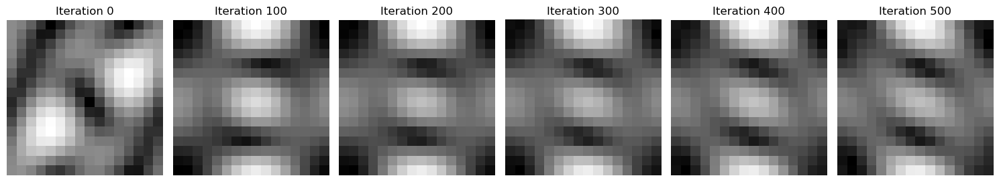

In [31]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch import nn
from numpy.fft import fft2, fftshift

# Function to load the model checkpoint
def load_model_checkpoint(checkpoint_path):
    model = get_net(input_depth, 'skip', pad,
                    n_channels=1,
                    skip_n33d=128, 
                    skip_n33u=128, 
                    skip_n11=4, 
                    num_scales=5,
                    upsample_mode='bilinear').type(dtype)
    model.load_state_dict(torch.load(checkpoint_path))
    model.eval()
    return model

# Function to extract a specific kernel from a convolutional layer
def extract_kernel(model, layer_name, kernel_index):
    for name, module in model.named_modules():
        if name == layer_name and isinstance(module, nn.Conv2d):
            # Extract the kernel: shape = (out_channels, in_channels, kH, kW)
            kernel = module.weight.data.cpu().numpy()[kernel_index, 0, :, :]
            return kernel
    raise ValueError(f"Layer '{layer_name}' not found in the model.")

# Function to compute the 2D DFT magnitude of a kernel
def compute_dft_magnitude(kernel):
    # Compute the 2D FFT
    dft = fft2(kernel, s=(16, 16))
    # Shift the zero-frequency component to the center
    dft_shifted = fftshift(dft)
    # Compute the magnitude spectrum
    magnitude = np.abs(dft_shifted)
    return magnitude

# List of checkpoint paths
checkpoint_paths = [
    'net_checkpoint_iteration_0.pth',
    'net_checkpoint_iteration_100.pth',
    'net_checkpoint_iteration_200.pth',
    'net_checkpoint_iteration_300.pth',
    'net_checkpoint_iteration_400.pth',
    'net_checkpoint_iteration_500.pth'
]

# Target layer name and kernel index
target_layer_name = '3.1'
kernel_index = 0  # Index of the kernel to visualize

# Initialize a list to store DFT magnitudes
dft_magnitudes = []

# Iterate over each checkpoint
for checkpoint_path in checkpoint_paths:
    # Load the model
    model = load_model_checkpoint(checkpoint_path)
    # Extract the kernel
    kernel = extract_kernel(model, target_layer_name, kernel_index)
    # Compute the DFT magnitude
    dft_magnitude = compute_dft_magnitude(kernel)
    dft_magnitudes.append(dft_magnitude)

# Plot all DFT magnitudes side by side
num_kernels = len(dft_magnitudes)
fig, axes = plt.subplots(1, num_kernels, figsize=(15, 5))
for i, dft_magnitude in enumerate(dft_magnitudes):
    ax = axes[i]
    im = ax.imshow(dft_magnitude, cmap='gray')
    ax.set_title(f'Iteration {i * 100}')
    ax.axis('off')

# Add a colorbar
# fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.6)
# cbar = plt.colorbar()

# Remove the colorbar
# cbar.remove()
plt.tight_layout()
plt.show()


In [18]:

# Global variable to store the output of the target layer
layer_output = None

# Define the hook function
def hook_fn(module, input, output):
    global layer_output
    layer_output = output.detach().cpu()

# Find the module with the exact name "3.1"
target_name =  "1.1.7.3.1"  #"3.1"
target_module = None
for name, module in net.named_modules():
    if name == target_name:
        target_module = module
        break

if target_module is None:
    raise ValueError(f"No layer found with the exact name '{target_name}'")
else:
    # Register the forward hook on the target module
    hook_handle = target_module.register_forward_hook(hook_fn)
    print(f"Hook registered on layer: {target_name}")

# Feed an input through the model
# Make sure your input tensor is properly shaped and on the correct device
input_tensor = net_input
# torch.randn(1, 32, 256, 256)  # example input, adjust as needed
output = net(input_tensor)

# Now, layer_output contains the output of the layer named "3.1"
print("Output from layer", target_name, "has shape:", layer_output.shape)

# When finished, remove the hook to avoid interfering with future computations
hook_handle.remove()


Hook registered on layer: 1.1.7.3.1
Output from layer 1.1.7.3.1 has shape: torch.Size([1, 128, 75, 75])


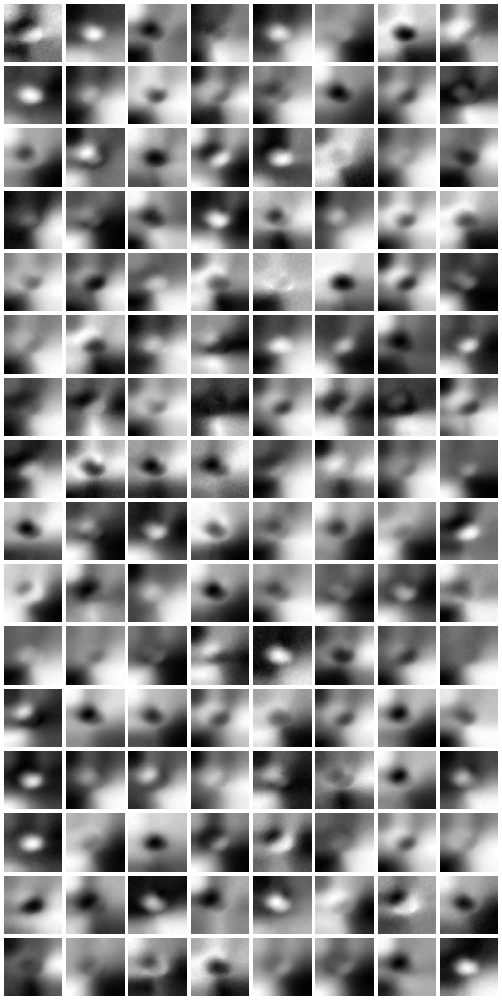

In [19]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

fig = plt.figure(figsize=(16, 32))  # Adjust the figure size as needed
grid = ImageGrid(fig, 111, nrows_ncols=(16, 8), axes_pad=0.1)

for i in range(128):
    ax = grid[i]
    ax.imshow(layer_output[0, i, :, :], cmap='gray')
    ax.axis('off')  # Hide axes ticks

plt.show()
    

In [30]:
layer_name_contains = None
for name, module in net.named_modules():
    if isinstance(module, nn.Conv2d):
        # print('True')
        # If filtering, skip layers that don't match
        if layer_name_contains is not None and layer_name_contains not in name:
            continue
        found_layer = True
        # Print for debugging
        print("Found Conv2d layer:", name, module.kernel_size)
              # .weight.shape)
    

Found Conv2d layer: 1.0.1.1 (1, 1)
Found Conv2d layer: 1.1.1.1 (3, 3)
Found Conv2d layer: 1.1.4.1 (3, 3)
Found Conv2d layer: 1.1.7.1.0.1.1 (1, 1)
Found Conv2d layer: 1.1.7.1.1.1.1 (3, 3)
Found Conv2d layer: 1.1.7.1.1.4.1 (3, 3)
Found Conv2d layer: 1.1.7.1.1.7.1.0.1.1 (1, 1)
Found Conv2d layer: 1.1.7.1.1.7.1.1.1.1 (3, 3)
Found Conv2d layer: 1.1.7.1.1.7.1.1.4.1 (3, 3)
Found Conv2d layer: 1.1.7.1.1.7.1.1.7.1.0.1.1 (1, 1)
Found Conv2d layer: 1.1.7.1.1.7.1.1.7.1.1.1.1 (3, 3)
Found Conv2d layer: 1.1.7.1.1.7.1.1.7.1.1.4.1 (3, 3)
Found Conv2d layer: 1.1.7.1.1.7.1.1.7.1.1.7.1.0.1.1 (1, 1)
Found Conv2d layer: 1.1.7.1.1.7.1.1.7.1.1.7.1.1.1.1 (3, 3)
Found Conv2d layer: 1.1.7.1.1.7.1.1.7.1.1.7.1.1.4.1 (3, 3)
Found Conv2d layer: 1.1.7.1.1.7.1.1.7.1.1.7.3.1 (3, 3)
Found Conv2d layer: 1.1.7.1.1.7.1.1.7.1.1.7.6.1 (1, 1)
Found Conv2d layer: 1.1.7.1.1.7.1.1.7.3.1 (3, 3)
Found Conv2d layer: 1.1.7.1.1.7.1.1.7.6.1 (1, 1)
Found Conv2d layer: 1.1.7.1.1.7.3.1 (3, 3)
Found Conv2d layer: 1.1.7.1.1.7.6.1 (1, 1)
F

In [21]:
net.get_parameter

<bound method Module.get_parameter of Sequential(
  (1): Concat(
    (0): Sequential(
      (1): Sequential(
        (0): ReflectionPad2d((0, 0, 0, 0))
        (1): Conv2d(32, 4, kernel_size=(1, 1), stride=(1, 1))
      )
      (2): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (1): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(32, 128, kernel_size=(3, 3), stride=(2, 2))
      )
      (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): LeakyReLU(negative_slope=0.2, inplace=True)
      (4): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
      )
      (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): LeakyReLU(negative_slope=0.2, inplace=True)
      (7): Sequential(
        (1):

In [19]:
if isinstance(net, nn.Conv2d):
    print("Found Conv2d layer:", name, net.weight.shape)


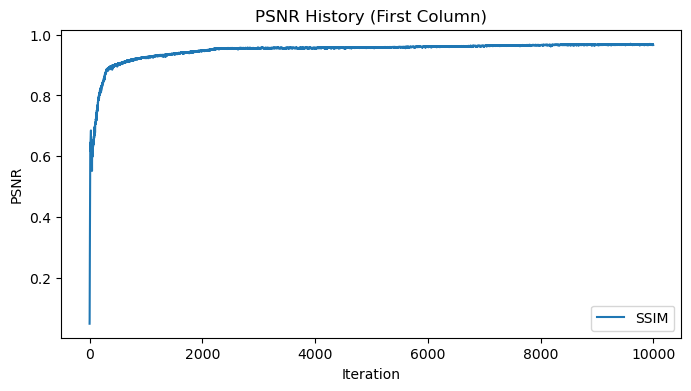

In [16]:
import numpy as np
import matplotlib.pyplot as plt

# Convert the list to a numpy array if it contains sublists of equal length
psnr_history_np = np.array(psnr_history)

iterations = np.arange(len(psnr_history_np))
plt.figure(figsize=(8, 4))
plt.plot(iterations, psnr_history_np[:, -1], label='SSIM')
plt.xlabel('Iteration')
plt.ylabel('PSNR')
plt.title('PSNR History (First Column)')
plt.legend()
plt.show()


In [74]:
def closure():
    global i, net_input
    
    # Add regularization noise if needed
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    # Forward pass: generate HR output and downsample to get LR output
    out_HR = net(net_input)
    out_LR = downsampler(out_HR)

    # Compute loss on the LR output against the LR target
    total_loss = mse(out_LR, img_LR_var) 
    if tv_weight > 0:
        total_loss += tv_weight * tv_loss(out_HR)
        
    total_loss.backward()

    # Convert torch outputs to numpy arrays
    out_HR_np = torch_to_np(out_HR)
    out_LR_np = torch_to_np(out_LR)
    
    # Helper function: convert to grayscale if necessary.
    # For a 3-channel image, average the channels. If already grayscale, return as is.
    def to_grayscale(img):
        if img.shape[0] == 3:
            return np.mean(img, axis=0, keepdims=True)
        return img

    # Convert target and output images to grayscale
    lr_target_gray = to_grayscale(img_LR_np)
    lr_output_gray = to_grayscale(out_LR_np)
    hr_target_gray = to_grayscale(img_HR_np)
    hr_output_gray = to_grayscale(out_HR_np)

    # Prepare for PSNR calculation: remove the channel dimension, resulting in shape (H, W)
    def prepare_for_psnr_gray(img):
        return img[0]

    # Compute PSNR values using single-channel images
    psnr_LR = compare_psnr(prepare_for_psnr_gray(lr_target_gray), prepare_for_psnr_gray(lr_output_gray))
    psnr_HR = compare_psnr(prepare_for_psnr_gray(hr_target_gray), prepare_for_psnr_gray(hr_output_gray))

    print('Iteration %05d    PSNR_LR %.3f   PSNR_HR %.3f' % (i, psnr_LR, psnr_HR), '\r', end='')
                      
    # Record PSNR history
    psnr_history.append([psnr_LR, psnr_HR])
    
    # Optionally plot images every 100 iterations
    if PLOT and i % 100 == 0:
        plot_image_grid([imgs['HR_np'], imgs['bicubic_np'], np.clip(out_HR_np, 0, 1)], factor=13, nrow=3)

    i += 1
    
    return total_loss


In [75]:
psnr_history = [] 
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

i = 0
p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

Starting optimization with ADAM


/local_scratch/slurm.2481109/ipykernel_1172057/3035138582.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_LR = compare_psnr(prepare_for_psnr_gray(lr_target_gray), prepare_for_psnr_gray(lr_output_gray))
/local_scratch/slurm.2481109/ipykernel_1172057/3035138582.py:42: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_HR = compare_psnr(prepare_for_psnr_gray(hr_target_gray), prepare_for_psnr_gray(hr_output_gray))


RuntimeError: stack expects each tensor to be equal size, but got [3, 384, 576] at entry 0 and [3, 150, 150] at entry 2

# Load image and baselines

HR and LR resolutions: (576, 384), (288, 192)


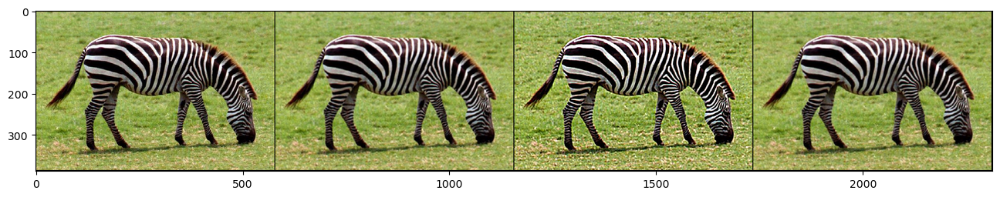

PSNR bicubic: 29.8554   PSNR nearest: 25.8767


In [47]:
# Starts here
imgs = load_LR_HR_imgs_sr(path_to_image , imsize, factor, enforse_div32)

imgs['bicubic_np'], imgs['sharp_np'], imgs['nearest_np'] = get_baselines(imgs['LR_pil'], imgs['HR_pil'])

if PLOT:
    plot_image_grid([imgs['HR_np'], imgs['bicubic_np'], imgs['sharp_np'], imgs['nearest_np']], 4,12);
    print ('PSNR bicubic: %.4f   PSNR nearest: %.4f' %  (
                                        compare_psnr(imgs['HR_np'], imgs['bicubic_np']), 
                                        compare_psnr(imgs['HR_np'], imgs['nearest_np'])))

# Set up parameters and net

In [56]:
imgs['HR_np'].shape

(3, 384, 576)

In [ ]:
input_depth = 32
 
INPUT =     'noise'
pad   =     'reflection'
OPT_OVER =  'net'
KERNEL_TYPE='lanczos2'

LR = 0.01
tv_weight = 0.0

OPTIMIZER = 'adam'

if factor == 4: 
    num_iter = 2000
    reg_noise_std = 0.03
elif factor == 8:
    num_iter = 4000
    reg_noise_std = 0.05
else:
    assert False, 'We did not experiment with other factors'

In [35]:
net_input = get_noise(input_depth, INPUT, (imgs['HR_pil'].size[1], imgs['HR_pil'].size[0])).type(dtype).detach()

NET_TYPE = 'skip' # UNet, ResNet
net = get_net(input_depth, 'skip', pad,
              skip_n33d=128, 
              skip_n33u=128, 
              skip_n11=4, 
              num_scales=5,
              upsample_mode='bilinear').type(dtype)

# Losses
mse = torch.nn.MSELoss().type(dtype)

img_LR_var = np_to_torch(imgs['LR_np']).type(dtype)

downsampler = Downsampler(n_planes=1, factor=factor, kernel_type=KERNEL_TYPE, phase=0.5, preserve_size=True).type(dtype)

NameError: name 'imgs' is not defined

# Define closure and optimize

In [ ]:
def closure():
    global i, net_input
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out_HR = net(net_input)
    out_LR = downsampler(out_HR)

    total_loss = mse(out_LR, img_LR_var) 
    
    if tv_weight > 0:
        total_loss += tv_weight * tv_loss(out_HR)
        
    total_loss.backward()

    # Log
    psnr_LR = compare_psnr(imgs['LR_np'], torch_to_np(out_LR))
    psnr_HR = compare_psnr(imgs['HR_np'], torch_to_np(out_HR))
    print ('Iteration %05d    PSNR_LR %.3f   PSNR_HR %.3f' % (i, psnr_LR, psnr_HR), '\r', end='')
                      
    # History
    psnr_history.append([psnr_LR, psnr_HR])
    
    if PLOT and i % 100 == 0:
        out_HR_np = torch_to_np(out_HR)
        plot_image_grid([imgs['HR_np'], imgs['bicubic_np'], np.clip(out_HR_np, 0, 1)], factor=13, nrow=3)

    i += 1
    
    return total_loss

In [ ]:
psnr_history = [] 
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

i = 0
p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

In [ ]:
out_HR_np = np.clip(torch_to_np(net(net_input)), 0, 1)
result_deep_prior = put_in_center(out_HR_np, imgs['orig_np'].shape[1:])

# For the paper we acually took `_bicubic.png` files from LapSRN viewer and used `result_deep_prior` as our result
plot_image_grid([imgs['HR_np'],
                 imgs['bicubic_np'],
                 out_HR_np], factor=4, nrow=1);

In [29]:
kernel_width = 9
phase = 0.5
support=2
kernel = np.zeros([kernel_width - 1, kernel_width - 1])

In [31]:
kernel.shape

(8, 8)

In [32]:
center = (kernel_width + 1) / 2

for i in range(1, kernel.shape[0] + 1):
    for j in range(1, kernel.shape[1] + 1):
        if phase == 0.5:
            di = abs(i + 0.5 - center) / factor  
            dj = abs(j + 0.5 - center) / factor 
        else:
            di = abs(i - center) / factor
            dj = abs(j - center) / factor
                
        pi_sq = np.pi * np.pi

        val = 1
        if di != 0:
            val = val * support * np.sin(np.pi * di) * np.sin(np.pi * di / support)
            val = val / (np.pi * np.pi * di * di)
        
        if dj != 0:
            val = val * support * np.sin(np.pi * dj) * np.sin(np.pi * dj / support)
            val = val / (np.pi * np.pi * dj * dj)
                
        kernel[i - 1][j - 1] = val
            
        
kernel /= kernel.sum()
    

In [34]:
kernel.shape

(8, 8)

In [35]:
kernel.shape[0] % 2 == 1

False

In [36]:
pad = int((kernel.shape[0] - factor) / 2.)

In [37]:
pad

3

In [38]:
m=nn.ReplicationPad2d(pad)

In [39]:
inp = torch.arange(150*150, dtype=torch.float).reshape(1, 1, 150, 150)

In [40]:
inp.shape

torch.Size([1, 1, 150, 150])

In [41]:
opt = m(inp)

In [42]:
opt.shape

torch.Size([1, 1, 156, 156])